# Tutorial: Relative Elevation Model Visualization
- Author: [Claudio Ortega]
- Based on "[Create a Relative Elevation Model (REM) in Python using xarray](https://dancoecarto.com/creating-rems-in-qgis-the-idw-method)" by [Dahn Jahn](https://twitter.com/DahnJahn)
- This tutorial creates the REM for the center sector of Piura, Piura, Peru

A REM is created by subtracting the river's elevation from a **Digital Elevation Model**, displaying the **height above river**. This makes the river's [meanders](https://en.wikipedia.org/wiki/Meander) more visible.

![](https://i.imgur.com/aVHm3yC.png)

([image source](https://ngmdb.usgs.gov/Info/dmt/docs/DMT16_Coe.pdf))

# Step 0: Setup

### ONLY NECESSARY ON GOOGLE COLAB

In [1]:
# # Clone repo
# !rm REM-xarray -rf
# !git clone https://github.com/Claudio9701/REM-xarray.git

# # Change working directory and install requirements
# %cd REM-xarray
# !pip install -r requirements.txt

# # Install Urbanpy
# !pip install urbanpy==0.2.2dev0 contextily --quiet

### Imports

In [2]:
from secret import MAPBOX_ACCESS_TOKEN

import numpy as np
import pandas as pd
import geopandas as gpd  # Vector data handling
import osmnx as ox  # Downloading data from OSM

from shapely.ops import linemerge
from shapely.geometry import box
from scipy.spatial import cKDTree as KDTree  # For Inverse Distance Weight calculation

import xarray as xr
import xrspatial  # Hillshading
import rioxarray  # Working with geospatial data in xarray

import matplotlib.pyplot as plt
from datashader.transfer_functions import shade, stack
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1 import make_axes_locatable

import contextily as ctx
import urbanpy as up

/home/claudio/.virtualenvs/rem-xarray/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# BASEMAP PARAMETERS
BASEMAP = ctx.providers.MapBox(id="mapbox/satellite-v9", accessToken=MAPBOX_ACCESS_TOKEN)
BASEMAP_WITH_LABELS = ctx.providers.MapBox(id="mapbox/satellite-streets-v12", accessToken=MAPBOX_ACCESS_TOKEN)
BASEMAP_LABELS = ctx.providers.CartoDB.VoyagerOnlyLabels

## Step 1: Define the Area of Interest

In [4]:
departamento_str = 'Piura, Peru'
provincia_str = 'Piura, Piura, Peru'

In [5]:
departamento_gdf = up.download.nominatim_osm(departamento_str)
ciudad_gdf = up.download.nominatim_osm(provincia_str, 1)

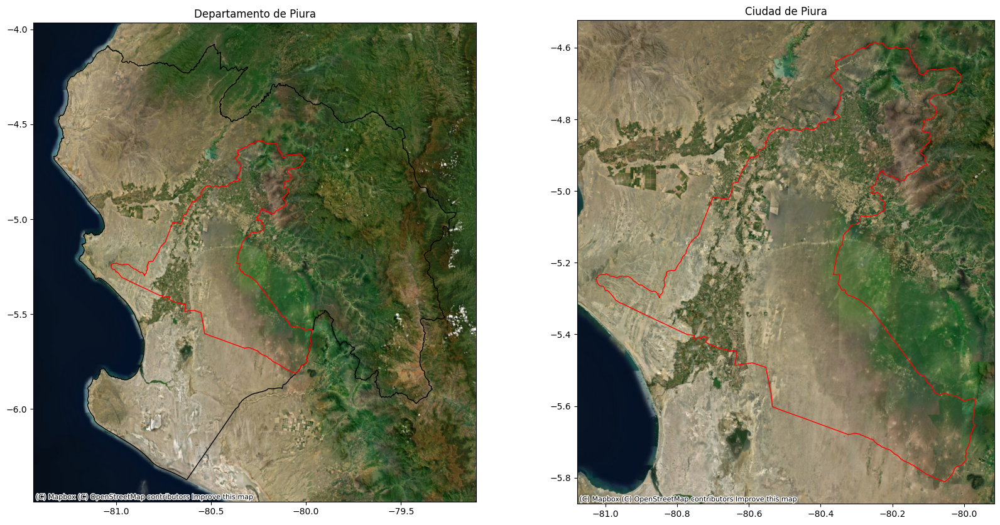

In [6]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

departamento_gdf.plot(facecolor="none", edgecolor="black", ax=ax1)
ciudad_gdf.plot(facecolor="none", edgecolor="red", ax=ax1)
ax1.set_title("Departamento de Piura")
ctx.add_basemap(ax1, crs=departamento_gdf.crs.to_string(), source=BASEMAP)

ciudad_gdf.plot(facecolor="none", edgecolor="red", ax=ax2)
ax2.set_title("Ciudad de Piura")
ctx.add_basemap(ax2, crs=departamento_gdf.crs.to_string(), source=BASEMAP)

In [7]:
city_center_point = up.download.nominatim_osm("Ciudad de Piura", 0)
# 1.11 km is 0.01 degrees --> 0.05 degrees is 5.55 km
area_of_interest = city_center_point.buffer(0.05).envelope

/tmp/ipykernel_22151/1101577839.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  area_of_interest = city_center_point.buffer(0.05).envelope


In [8]:
# Get area_of_interest area in meters
area_of_interest_m = area_of_interest.to_crs(epsg=32718).area[0]
# m2 to km
area_of_interest_km = area_of_interest_m / 1000000 # km2

print(f"Area of interest: {area_of_interest_km:.02f} km2")

Area of interest: 123.69 km2


## Step 2: Read River data

To get coordinates of the river, we can use freely available [OpenStreetMap](https://www.openstreetmap.org/) data. 

In [9]:
river = gpd.read_file("data/rio_piura.geojson", driver="GeoJSON")

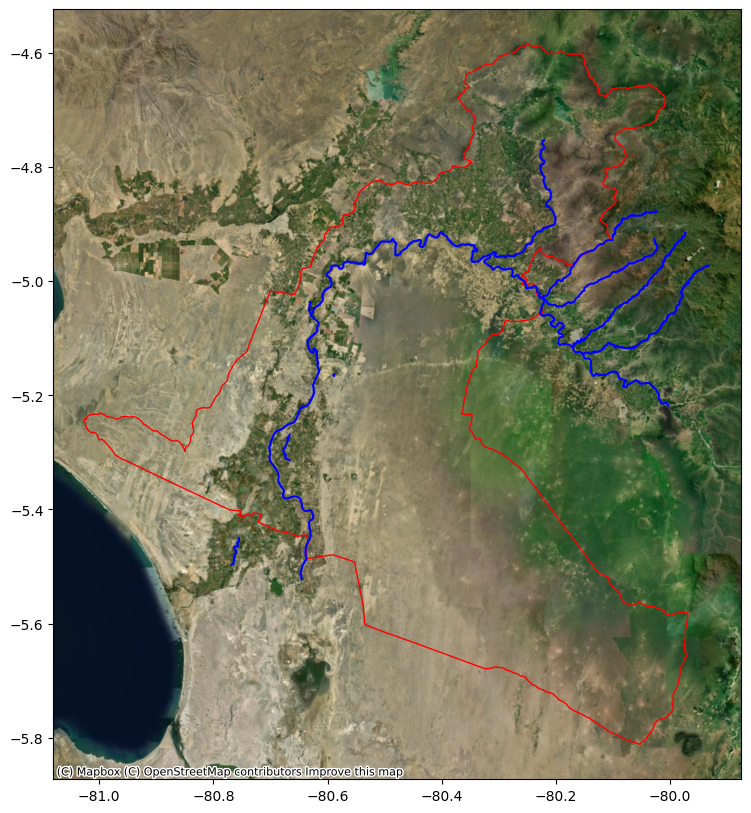

In [10]:
ax = ciudad_gdf.plot(facecolor="none", edgecolor="red", figsize=(10, 10))
river.plot(facecolor="none", edgecolor="blue", ax=ax)
ctx.add_basemap(ax, crs=departamento_gdf.crs.to_string(), source=BASEMAP)

In [11]:
river_clipped = river.clip(area_of_interest)
river_clipped

,id,@id,boat,intermittent,layer,name,source,tunnel,waterway,width,wikipedia,geometry
13,way/481150466,way/481150466,no,NaN,NaN,Río Piura,bing,NaN,river,50,es:Río Piura,"LINESTRING (-80.61741 -5.14714, -80.61744 -5.1..."
6,way/394219722,way/394219722,NaN,NaN,NaN,NaN,NaN,NaN,river,NaN,NaN,"LINESTRING (-80.59021 -5.16319, -80.59012 -5.1..."


In [12]:
# Remove the disconnected part of the river
river_clipped_cleaned = river_clipped.iloc[:1, :]

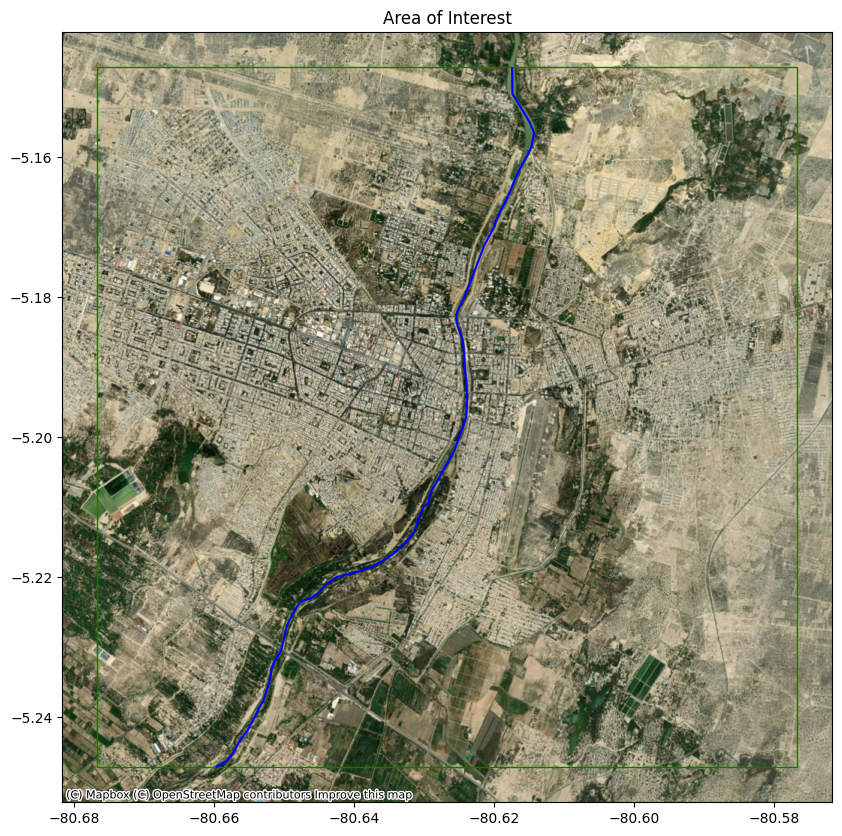

In [13]:
ax = area_of_interest.plot(facecolor="none", edgecolor="green", figsize=(10, 10))
river_clipped_cleaned.plot(facecolor="none", edgecolor="blue", ax=ax)
ax.set_title("Area of Interest")
ctx.add_basemap(ax, crs=departamento_gdf.crs.to_string(), source=BASEMAP)

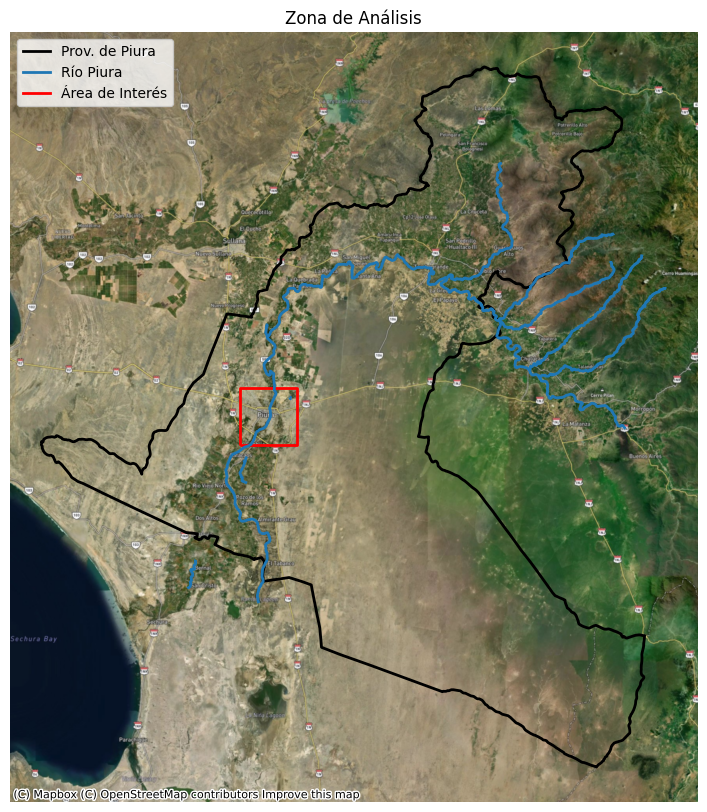

In [14]:
ax = ciudad_gdf.plot(facecolor="none", edgecolor="k", linewidth=2, figsize=(10, 10))
area_of_interest.plot(facecolor="none", edgecolor="r", linewidth=2, ax=ax)
river.plot(color="tab:blue", linewidth=2, ax=ax)

ax.set_title("Zona de Análisis")
ax.set_axis_off()

# Add legend
legend_elements = [
    Line2D([0], [0], color="k", lw=2, label="Prov. de Piura"),
    Line2D([0], [0], color="tab:blue", lw=2, label="Río Piura"),
    Line2D([0], [0], color="r", lw=2, label="Área de Interés"),

]
ax.legend(handles=legend_elements, loc="upper left")


ctx.add_basemap(ax, crs=departamento_gdf.crs.to_string(), source=BASEMAP_WITH_LABELS)

plt.savefig("data/aoi_piura.png", dpi=300, bbox_inches="tight")

plt.show()

## Step 3: Get the Digital Elevation Model

For this tutorial, we will use DEM of the **Piura river** from the [Copernicus Digital Elevation Model (DEM)](https://registry.opendata.aws/copernicus-dem/). 

- Format: Copernicus_DSM_COG_[resolution:int]_[northing:2d]_[easting:3d]_DEM/
- Example: s3://copernicus-dem-30m/Copernicus_DSM_COG_10_S80_00_W178_00_DEM/

In [15]:
# Get AOI Bounding Box
xmin, ymin, xmax, ymax = area_of_interest.total_bounds
xmin, ymin, xmax, ymax

(-80.6767237, -5.247137599999999, -80.5767237, -5.1471376)

In [16]:
# Code to handle DEM filenames to download

# Convert xmax longitude to  degrees, minutes, seconds
lon_deg = np.floor(xmax)
lat_deg = np.floor(ymax)
# Get the hemisphere
lon_hem = "E" if lon_deg > 0 else "W"
lat_hem = "N" if lat_deg > 0 else "S"
# Create the string for the filename
coords_string = f"{lat_hem}{abs(lat_deg):02.0f}_00_{lon_hem}{abs(lon_deg):03.0f}_00"
coords_strings = [coords_string]

# Do the same fo ymin, xmin 
# TODO: Make it a function
lon_deg = np.floor(xmin)
lat_deg = np.floor(ymin)
# Get the hemisphere
lon_hem = "E" if lon_deg > 0 else "W"
lat_hem = "N" if lat_deg > 0 else "S"
# Create the string for the filename
coords_string_min = f"{lat_hem}{abs(lat_deg):02.0f}_00_{lon_hem}{abs(lon_deg):03.0f}_00"

# Check if string is different from the previous one
if coords_string_min != coords_string:
    # If so, add it to the filename
    coords_strings.append(coords_string_min)

In [17]:
dem_filenames = [f"Copernicus_DSM_COG_10_{cs}_DEM" for cs in coords_strings]
dem_filenames

['Copernicus_DSM_COG_10_S06_00_W081_00_DEM']

In [18]:
# Download DEM
dems = [
    rioxarray.open_rasterio(f"s3://copernicus-dem-30m/{fn}/{fn}.tif")
    for fn in dem_filenames
]

In [19]:
# Merge DEMs
dem = xr.combine_by_coords(dems)
dem.shape

(1, 3600, 3600)

We will make the DEM smaller so that it's easier to work with

In [20]:
# Select the area of interest
dem_clipped = dem.sel(y=slice(ymax, ymin), x=slice(xmin, xmax))

Let's plot the DEM

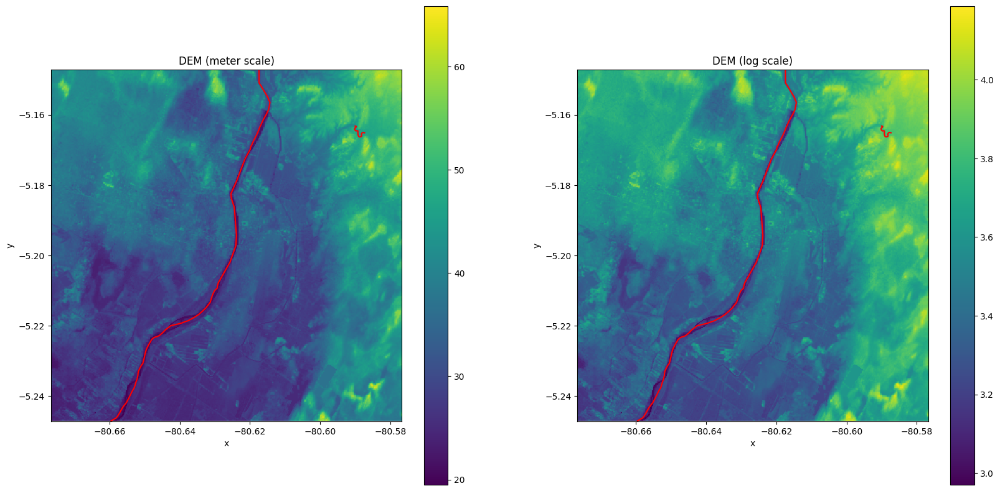

In [21]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

dem_clipped.squeeze().plot.imshow(ax=ax1)
river_clipped.plot(facecolor="none", edgecolor="red", ax=ax1)
ax1.set_title("DEM (meter scale)")

# Set ax1 limits to area_of_interest
ax1.set_xlim(xmin, xmax)
ax1.set_ylim(ymin, ymax)

np.log(dem_clipped.squeeze()).plot.imshow(ax=ax2)
river_clipped.plot(facecolor="none", edgecolor="red", ax=ax2)
ax2.set_title("DEM (log scale)")

# Set ax2 limits to area_of_interest
ax2.set_xlim(xmin, xmax)
ax2.set_ylim(ymin, ymax)

plt.show()

## Step 4: Calculate REM

To calculate the REM, we need to 
1. Sample the elevation along the river
2. Interpolate the sampled elevation values to create a 2D elevation raster
3. Subtract the interpolated elevation raster from the DEM

### 4.1. Sample

Extract coordinates as `DataArray`

In [22]:
river_geom = river_clipped_cleaned.iloc[0].geometry

In [23]:
xs, ys = river_geom.xy
xs, ys = xr.DataArray(xs, dims="z"), xr.DataArray(ys, dims="z")

Use xarray's [`interp`](https://xarray.pydata.org/en/stable/generated/xarray.DataArray.interp.html#xarray.DataArray.interp) to extract the river's elevation.

In [24]:
sampled = dem_clipped.interp(x=xs, y=ys, method="nearest").dropna(dim="z")

### 4.2. Interpolate

Prepare data for the interpolation

In [25]:
# Sampled river coordinates
c_sampled = np.vstack([sampled.coords[c].values for c in ("x", "y")]).T

# All (x, y) coordinates of the original DEM
c_x, c_y = [dem_clipped.coords[c].values for c in ("x", "y")]
c_interpolate = np.dstack(np.meshgrid(c_x, c_y)).reshape(-1, 2)

# Sampled values
values = sampled.values.ravel()

Perform the interpolation. Here we use a simple implementation of [IWD](https://en.wikipedia.org/wiki/Inverse_distance_weighting) which averages the 5 nearest points, weighted by inverse distance.

In [26]:
tree = KDTree(c_sampled)

In [27]:
# IWD interpolation
distances, indices = tree.query(c_interpolate, k=50)

weights = 1 / distances
weights = weights / weights.sum(axis=1).reshape(-1, 1)

interpolated_values = (weights * values[indices]).sum(axis=1)

We create a `DataArray` out of the inerpolated values

In [28]:
elevation_raster = xr.DataArray(
    interpolated_values.reshape((len(c_y), len(c_x))).T, dims=("x", "y"), coords={"x": c_x, "y": c_y}
)

(-5.247137599999999, -5.1471376)

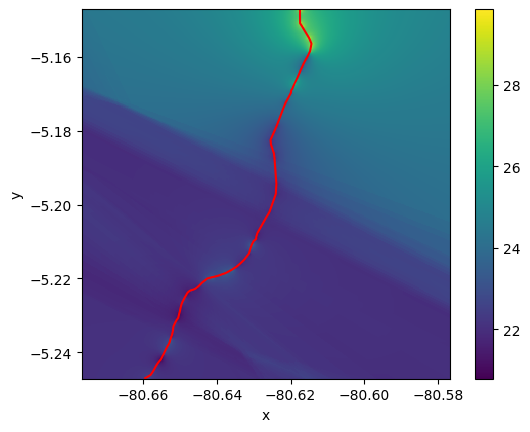

In [29]:
fig, ax = plt.subplots()
elevation_raster.transpose().plot.imshow(ax=ax)
river_clipped_cleaned.plot(ax=ax, color="red")

# Set ax limits to area_of_interest
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

### 4.3. Calculate

In [30]:
rem = dem_clipped - elevation_raster

## Step 5: Visualize

Let's make some pretty REM visualizations!

(-5.247137599999999, -5.1471376)

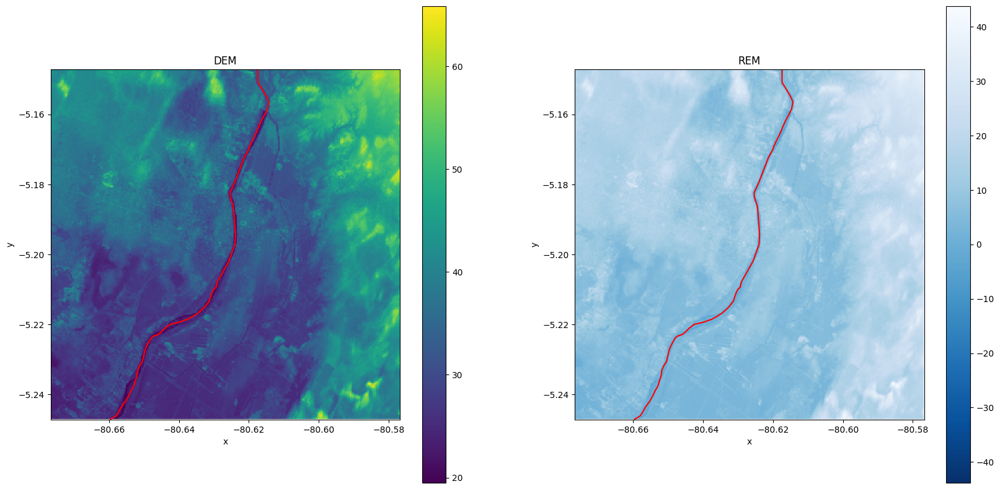

In [31]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

dem_clipped.squeeze().plot(ax=ax1)
river_clipped_cleaned.plot(facecolor="none", edgecolor="red", ax=ax1)
ax1.set_title("DEM")

# set margin to xmin, ymin, xmax, ymax
xmin, ymin, xmax, ymax = area_of_interest.total_bounds
ax1.set_xlim(xmin, xmax)
ax1.set_ylim(ymin, ymax)

rem.squeeze().plot(ax=ax2, cmap="Blues_r")
river_clipped_cleaned.plot(facecolor="none", edgecolor="red", ax=ax2)
ax2.set_title("REM")

ax2.set_xlim(xmin, xmax)
ax2.set_ylim(ymin, ymax)

In [32]:
colors = ['#f2f7fb', '#81a8cb', '#37123d']

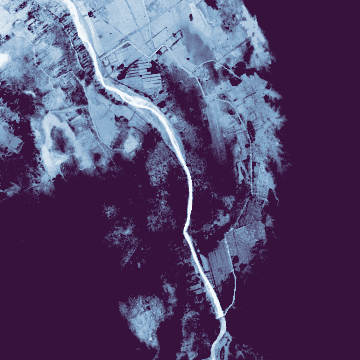

In [33]:
only_rem = shade(rem.squeeze(), cmap=colors, span=[0, 10], how="linear")
only_rem

In [34]:
only_rem.to_pil().save("data/only_rem_piura.png")

We can also visualize the DEM along with the REM

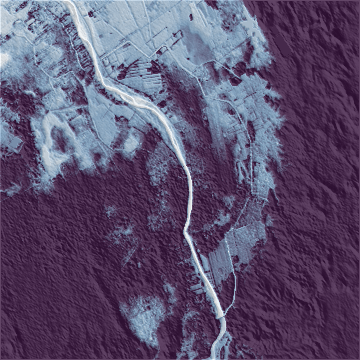

In [35]:
a = shade(xrspatial.hillshade(dem_clipped.squeeze(), angle_altitude=1, azimuth=310), cmap=["black", "white"], how="linear")
b = shade(rem.squeeze(), cmap=colors, span=[0, 10], how="linear", alpha=200)
result_rem = stack(a, b)
result_rem

In [36]:
result_rem_img = result_rem.to_pil()

In [37]:
result_rem_img.save("data/rem_hillshade_piura.png")

In [38]:
rem_squeezed = rem.squeeze().where(rem.squeeze() < 10)

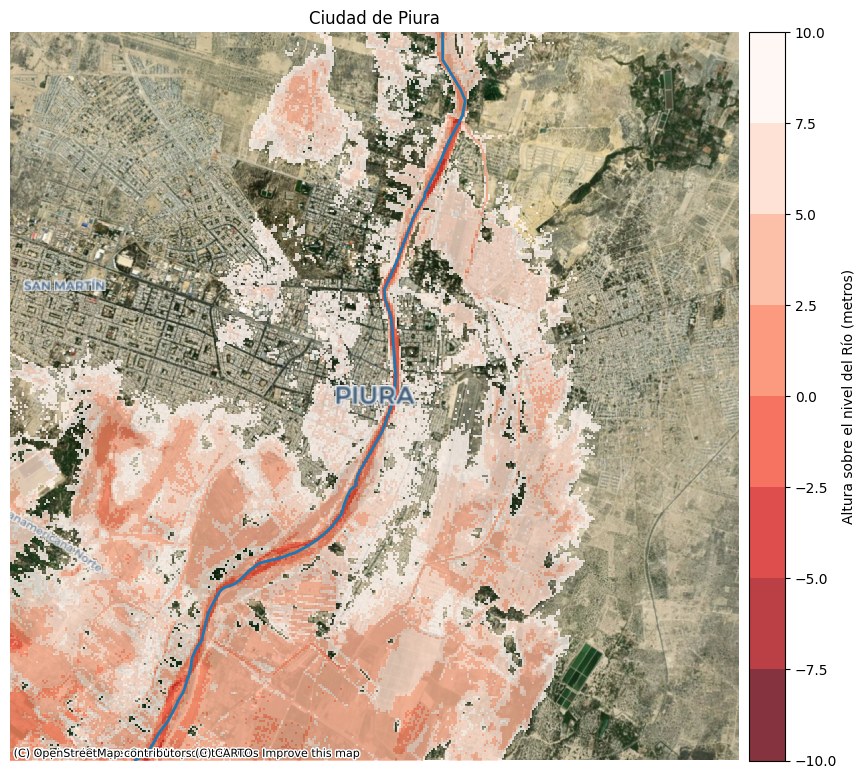

In [39]:
fig, ax = plt.subplots(1, figsize=(10, 10))

# Make cax with axes divider
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

# Plot REM 
rem_squeezed.plot(cmap="Reds_r", alpha=0.8, levels=10, ax=ax, cbar_ax=cax, cbar_kwargs={"label": "Altura sobre el nivel del Río (metros)"})
river_clipped_cleaned.plot(color="tab:blue", linewidth=2, ax=ax)

ax.set_title("Ciudad de Piura")
ax.set_axis_off()

# add satellite basemap
ctx.add_basemap(ax, crs=rem_squeezed.rio.crs, source=BASEMAP)
ctx.add_basemap(ax, crs=rem_squeezed.rio.crs, source=BASEMAP_LABELS)

plt.savefig("data/rem_map_piura.png", dpi=300, bbox_inches="tight")

plt.show()
